### Dataset from semi auto labeled 

In [1]:
import os

os.getcwd()

'/home/jovyan/__ANIMALS/datasets/ds3_auto_label'

#### Clear Directories

### D3: Manual:

### MODEL USED: yolov5su.pt

Total dataset: 2303

In [1]:
from ultralytics import YOLO

model_path = "/home/jovyan/__ANIMALS/datasets/ds3_auto_label/runs/detect/wildlife_new2/weights/best.pt"
model = YOLO(model_path)

data_yaml = "/home/jovyan/__ANIMALS/datasets/ds3_auto_label/animals.yaml"
    
    # Run validation
results = model.val(
        data=data_yaml,
        split='val',
        save_json=True,
        save_conf=True,
        save_txt=True
)
    

Ultralytics 8.3.104 🚀 Python-3.12.7 torch-2.6.0+cu124 CPU (Intel Xeon Processor (Icelake))
YOLOv5s summary (fused): 84 layers, 9,119,663 parameters, 0 gradients, 23.9 GFLOPs


val: Scanning /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/labels.cache... 478 images, 0 backgrounds, 0 corrupt: 100%|██████████| 478/478 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-16.1.DubovyCreek_008_3-15-2024_18-33.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_130_1-8-2024_15-57.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_188_1-11-2024_17-34.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_208_1-12-2024_17-45.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_220_1-14-2024_10-03.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_330_1-28-2024_04-43.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.Pe


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [01:44<00:00,  3.50s/it]


                   all        478        546      0.807      0.654      0.701      0.586
                badger         35         35      0.898      0.829      0.921       0.65
                  boar         22         30      0.925      0.826      0.928      0.775
            brown_bear          1          1      0.578          1      0.995      0.895
                  hare          2          2          1          0     0.0831     0.0665
                  lynx         19         19      0.943      0.869       0.95      0.786
             musk_deer          1          1          1          0          0          0
                 otter          1          1          1          0          0          0
               red_fox          7          8      0.592       0.75      0.802      0.651
          red_squirrel          7          8      0.852       0.75      0.847      0.722
         roe_deer_male         57         66      0.782      0.763      0.779      0.602
                 sabl

In [1]:
import os
import shutil

# Paths to the directories
train_images_dir = "train/images"
train_labels_dir = "train/labels"
val_images_dir = "val/images"
val_labels_dir = "val/labels"
run_dir = "runs/detect"

# Function to remove all files and directories within a given directory
def clear_directory(directory):
    try:
        # Remove all files and subdirectories within the specified directory
        for root, dirs, files in os.walk(directory, topdown=False):
            for name in files:
                os.remove(os.path.join(root, name))
            for name in dirs:
                os.rmdir(os.path.join(root, name))
        print(f"All files and subdirectories removed from {directory}.")
    except Exception as e:
        print(f"Error removing files from {directory}: {e}")

# Clear the train images directory
clear_directory(train_images_dir)

# Clear the train labels directory
clear_directory(train_labels_dir)

# Clear the validation images directory
clear_directory(val_images_dir)

# Clear the validation labels directory
clear_directory(val_labels_dir)

# Clear the validation labels directory
clear_directory(run_dir)

print("All directories have been cleared successfully.")

All files and subdirectories removed from train/images.
All files and subdirectories removed from train/labels.
All files and subdirectories removed from val/images.
All files and subdirectories removed from val/labels.
All files and subdirectories removed from runs/detect.
All directories have been cleared successfully.


#### Load JSON File and Extract Data

In [3]:
import json

# Paths
json_file = "result1.json"
images_dir = "/home/jovyan/__ANIMALS/images"

# Load JSON file
with open(json_file, "r") as f:
    coco_data = json.load(f)

# Extract image and annotation data
images = {img["id"]: img["file_name"].split("/")[-1] for img in coco_data["images"]}
annotations = coco_data["annotations"]
categories = {cat["id"]: cat["name"] for cat in coco_data["categories"]}

# Filter images to include only those with annotations
annotated_images = set(ann["image_id"] for ann in annotations)
filtered_images = {img_id: images[img_id] for img_id in images if img_id in annotated_images}

# Group images by category
category_to_image_ids = {name: set() for name in categories.values()}

for annotation in annotations:
    image_id = annotation["image_id"]
    category_id = annotation["category_id"]
    category_name = categories[category_id]
    
    # Add the image ID to the corresponding category
    category_to_image_ids[category_name].add(image_id)

# Convert sets to lists for splitting
category_to_image_ids = {k: list(v) for k, v in category_to_image_ids.items()}

#### Split Images into Train and Validation Sets

In [4]:
from sklearn.model_selection import train_test_split

# Split each category into train (80%) and validation (20%)
train_image_ids = []
val_image_ids = []

for category, image_ids in category_to_image_ids.items():
    if len(image_ids) > 1:
        train, val = train_test_split(image_ids, test_size=0.2, random_state=42, stratify=[category]*len(image_ids))
    else:
        train, val = image_ids, []  # Assign all images to train if there's only one

    train_image_ids.extend(train)
    val_image_ids.extend(val)

# Remove duplicates (in case an image belongs to multiple categories)
train_image_ids = list(set(train_image_ids))
val_image_ids = list(set(val_image_ids))

print(f"Total train images: {len(train_image_ids)}, Total validation images: {len(val_image_ids)}")

Total train images: 1858, Total validation images: 478


#### Copy Images to Train and Validation Folders

In [5]:
# Copy images to train and validation directories

# Paths
train_dir = "train"
val_dir = "val"


for img_id in train_image_ids:
    img_name = images[img_id].split("__")[-1]
    src = os.path.join(images_dir, img_name)
    dst = os.path.join(train_dir, "images", img_name)
    if os.path.exists(src):
        shutil.copyfile(src, dst)
    else:
        print(f"Warning: Train image {img_name} not found.")

for img_id in val_image_ids:
    img_name = images[img_id].split("__")[-1]
    src = os.path.join(images_dir, img_name)
    dst = os.path.join(val_dir, "images", img_name)
    if os.path.exists(src):
        shutil.copyfile(src, dst)
    else:
        print(f"Warning: Validation image {img_name} not found.")

print("Dataset split and organization completed successfully.")

Dataset split and organization completed successfully.


#### Generate YOLO-Compatible Labels

In [6]:
def convert_bbox_to_yolo(image_width, image_height, bbox):
    x, y, width, height = bbox
    x_center = (x + width / 2) / image_width
    y_center = (y + height / 2) / image_height
    width = width / image_width
    height = height / image_height
    return f"{x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"

def create_yolo_labels(images_dir, labels_dir, image_ids):
    for img_id in image_ids:
        # Get annotations for the image
        img_annotations = [ann for ann in annotations if ann["image_id"] == img_id]
        
        # Skip images without annotations
        if not img_annotations:
            continue
        
        # Get the image file name
        img_name = images[img_id].split("__")[-1]
        label_filename = img_name.replace(".JPG", ".txt").replace(".jpg", ".txt")
        label_path = os.path.join(labels_dir, label_filename)

        with open(label_path, "w") as label_file:
            for ann in img_annotations:
                class_id = ann["category_id"]
                bbox = ann["bbox"]
                
                # Get image dimensions from JSON
                img_width = 2048  
                img_height = 1536 
                
                # Convert bbox to YOLO format
                yolo_bbox = convert_bbox_to_yolo(img_width, img_height, bbox)
                
                # Write to label file
                label_file.write(f"{class_id} {yolo_bbox}\n")

# Generate labels for train and validation sets
print("Generating YOLO labels for train set...")
create_yolo_labels(os.path.join(train_dir, "images"), os.path.join(train_dir, "labels"), train_image_ids)

print("Generating YOLO labels for validation set...")
create_yolo_labels(os.path.join(val_dir, "images"), os.path.join(val_dir, "labels"), val_image_ids)

print("YOLO label extraction complete!")

Generating YOLO labels for train set...
Generating YOLO labels for validation set...
YOLO label extraction complete!


#### Verify Dataset Integrity

In [7]:
import os

# Function to count files with a specific extension
def count_files(directory, extension):
    return len([f for f in os.listdir(directory) if f.endswith(extension)])

# Count images and labels
train_image_count = count_files(os.path.join(train_dir, "images"), ".JPG") + count_files(os.path.join(train_dir, "images"), ".jpg")
train_label_count = count_files(os.path.join(train_dir, "labels"), ".txt")
val_image_count = count_files(os.path.join(val_dir, "images"), ".JPG") + count_files(os.path.join(val_dir, "images"), ".jpg")
val_label_count = count_files(os.path.join(val_dir, "labels"), ".txt")

# Print results
print(f"Train Images: {train_image_count}, Train Labels: {train_label_count}")
print(f"Validation Images: {val_image_count}, Validation Labels: {val_label_count}")

# Check for mismatches
if train_image_count != train_label_count:
    print("Warning: Mismatch between train images and labels!")
if val_image_count != val_label_count:
    print("Warning: Mismatch between validation images and labels!")

Train Images: 1858, Train Labels: 1858
Validation Images: 478, Validation Labels: 478


#### Exploratory Data Analysis (EDA)

       Category_Name  Train_Count  Val_Count
12  sika_deer_female          810        197
14             tiger          399        100
9    roe_deer_female          250         66
13    sika_deer_male          172         47
1               boar          142         30
0             badger          138         35
4               lynx           74         19
10     roe_deer_male           65         17
8            red_fox           28          8
11             sable           28          7
7            raccoon           27          8
16          wild_cat           12          3
17     yellow_marten            9          3
3               hare            6          2
15       ussuri_bear            3          1
2         brown_bear            2          1
6              otter            1          1
5          musk_deer            1          1


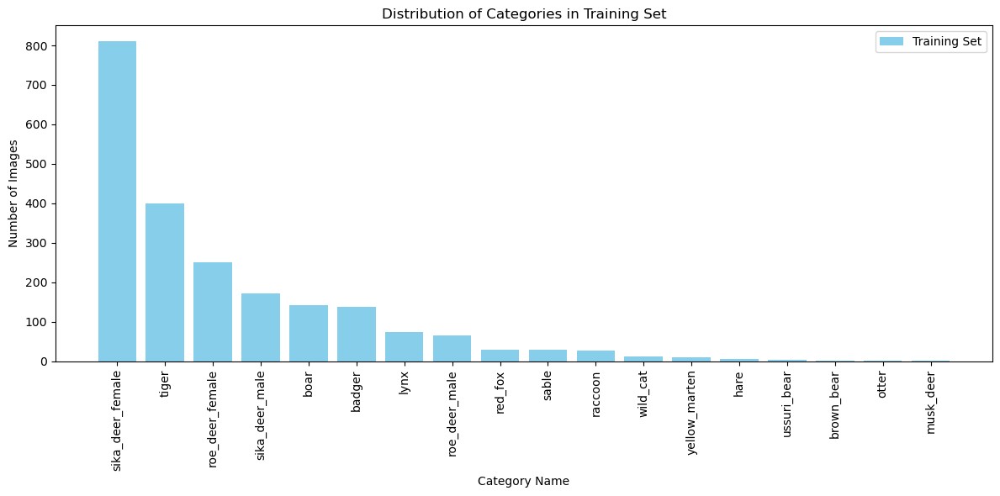

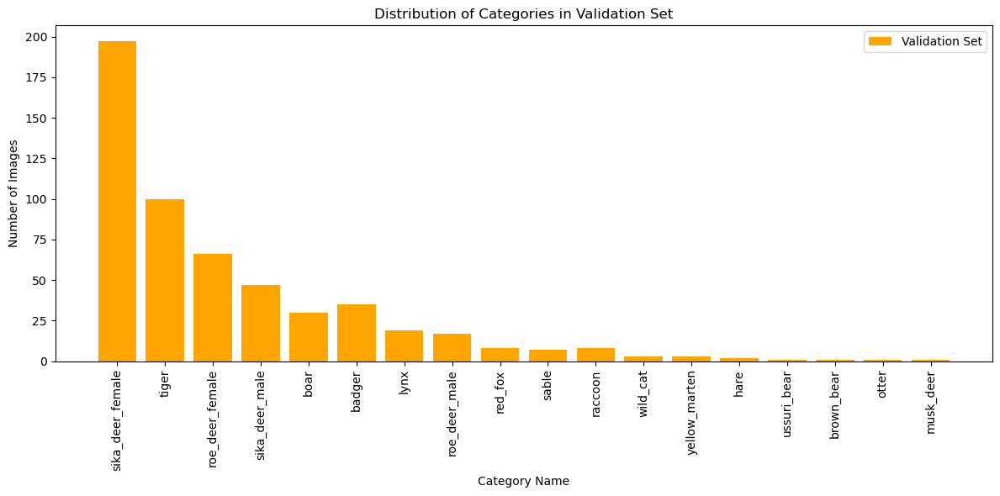

In [8]:
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

# Function to count images per category
def count_images_per_category(image_ids, annotations):
    category_counts = Counter()
    for img_id in image_ids:
        img_annotations = [ann for ann in annotations if ann["image_id"] == img_id]
        for ann in img_annotations:
            category_counts[ann["category_id"]] += 1
    return category_counts

# Count images per category in train and validation sets
train_category_counts = count_images_per_category(train_image_ids, annotations)
val_category_counts = count_images_per_category(val_image_ids, annotations)

# Convert category counts to DataFrame for easier visualization
train_df = pd.DataFrame(list(train_category_counts.items()), columns=['Category_ID', 'Train_Count'])
val_df = pd.DataFrame(list(val_category_counts.items()), columns=['Category_ID', 'Val_Count'])

# Merge the DataFrames
eda_df = pd.merge(train_df, val_df, on='Category_ID', how='outer').fillna(0)
eda_df['Category_Name'] = [categories.get(cid, 'Unknown') for cid in eda_df['Category_ID']]
eda_df = eda_df[['Category_Name', 'Train_Count', 'Val_Count']].sort_values(by='Train_Count', ascending=False)

# Print the EDA results
print(eda_df)

# Plot the distribution of categories in the training set
plt.figure(figsize=(12, 6))
plt.bar(eda_df['Category_Name'], eda_df['Train_Count'], color='skyblue', label='Training Set')
plt.xticks(rotation=90)
plt.xlabel('Category Name')
plt.ylabel('Number of Images')
plt.title('Distribution of Categories in Training Set')
plt.legend()
plt.tight_layout()
plt.show()

# Plot the distribution of categories in the validation set
plt.figure(figsize=(12, 6))
plt.bar(eda_df['Category_Name'], eda_df['Val_Count'], color='orange', label='Validation Set')
plt.xticks(rotation=90)
plt.xlabel('Category Name')
plt.ylabel('Number of Images')
plt.title('Distribution of Categories in Validation Set')
plt.legend()
plt.tight_layout()
plt.show()

#### YOLO MODEL

In [ ]:
!pip install ultralytics 

In [10]:
import os

train_labels = "/home/jovyan/__ANIMALS/datasets/ds3_auto_label//train/labels"
val_labels = "/home/jovyan/__ANIMALS/datasets/ds3_auto_label//val/labels"
train_instances = sum(len(open(os.path.join(train_labels, f), 'r').readlines()) for f in os.listdir(train_labels) if os.path.getsize(os.path.join(train_labels, f)) > 0)
val_instances = sum(len(open(os.path.join(val_labels, f), 'r').readlines()) for f in os.listdir(val_labels) if os.path.getsize(os.path.join(val_labels, f)) > 0)
print("Train instances:", train_instances)
print("Val instances:", val_instances)

Train instances: 2167
Val instances: 546


In [11]:
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image

# Define dataset path
dataset_path = "/home/jovyan/__ANIMALS/datasets/ds3_auto_label"

# Check if dataset exists
if os.path.exists(dataset_path):
    print(f"Dataset found at {dataset_path}")
    print("Training Images:", os.listdir(os.path.join(dataset_path, "train/images"))[:5])
    print("Validation Images:", os.listdir(os.path.join(dataset_path, "val/images/"))[:5])
else:
    print("Dataset not found. Please check the path.")

Dataset found at /home/jovyan/__ANIMALS/datasets/ds3_auto_label
Training Images: ['Uss-1.1.AnikinRidge_002_12-17-2023_15-00.JPG', 'Uss-1.1.AnikinRidge_004_12-22-2023_15-40.JPG', 'Uss-1.1.AnikinRidge_005_12-22-2023_15-41.JPG', 'Uss-1.1.AnikinRidge_007_1-13-2024_13-12.JPG', 'Uss-1.1.AnikinRidge_008_1-20-2024_15-10.JPG']
Validation Images: ['Uss-1.1.AnikinRidge_003_12-21-2023_09-22.JPG', 'Uss-1.1.AnikinRidge_006_1-8-2024_19-13.JPG', 'Uss-1.1.AnikinRidge_015_1-31-2024_02-33.JPG', 'Uss-1.1.AnikinRidge_017_2-15-2024_16-12.JPG', 'Uss-10.1.Goluboy_003_12-16-2023_11-28.JPG']


In [3]:
!pip install ultralytics


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [6]:
from ultralytics import YOLO

MODEL_NAME = "yolov5su.pt"  # Options: yolov8n.pt, yolov8s.pt, yolov10s.pt, yolov10m.pt

# Load a pretrained YOLO model
model = YOLO(MODEL_NAME)

# Check if the model file exists
if os.path.exists(MODEL_NAME):
    print(f"Model {MODEL_NAME} loaded successfully.")
else:
    print(f"Model file {MODEL_NAME} not found. Please check the path.")

Model yolov5su.pt loaded successfully.


In [7]:
results = model.train(
    data="animals.yaml",
    epochs=100,
    batch=8,
    imgsz=640,
    lr0=0.003,
    patience=30,
    conf=0.25,  # Adjusted confidence threshold
    weight_decay=0.001,
    box=10.0,
    cls=1.5,
    augment=True,  # Enable data augmentation
    save_period=10,  # Save checkpoints every 10 epochs
    pretrained=True,  # Start from pretrained weights
    name = "wildlife_new"
    
)

Ultralytics 8.3.99 🚀 Python-3.12.7 torch-2.6.0+cu124 CPU (Intel Xeon Processor (Icelake))
engine/trainer: task=detect, mode=train, model=yolov5su.pt, data=animals.yaml, epochs=100, time=None, patience=30, batch=8, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=None, name=wildlife_new2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=0.25, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxe

train: Scanning /home/jovyan/__ANIMALS/datasets/ds3_auto_label/train/labels.cache... 1858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1858/1858 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/train/images/Uss-16.1.DubovyCreek_005_2-9-2024_23-30.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/train/images/Uss-16.1.DubovyCreek_006_2-18-2024_00-00.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/train/images/Uss-16.1.DubovyCreek_007_3-4-2024_03-03.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/train/images/Uss-16.1.DubovyCreek_009_3-19-2024_15-26.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/train/images/Uss-16.1.DubovyCreek_011_3-27-2024_21-30.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/train/images/Uss-2.1.PetrovskyPass_085_12-30-2023_17-50.JPG: corrupt JPEG restored and saved
train: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/labels.cache... 478 images, 0 backgrounds, 0 corrupt: 100%|██████████| 478/478 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-16.1.DubovyCreek_008_3-15-2024_18-33.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_130_1-8-2024_15-57.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_188_1-11-2024_17-34.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_208_1-12-2024_17-45.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_220_1-14-2024_10-03.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_330_1-28-2024_04-43.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.Pe

Plotting labels to runs/detect/wildlife_new2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.003' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0004, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.001), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/wildlife_new2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.357      7.961      1.219          3        640: 100%|██████████| 233/233 [31:30<00:00,  8.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:55<00:00,  5.84s/it]

                   all        478        546      0.212      0.203       0.21      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      1.355      5.102       1.18          9        640: 100%|██████████| 233/233 [31:03<00:00,  8.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:55<00:00,  5.84s/it]

                   all        478        546       0.22      0.278      0.257      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      1.344      4.601      1.167          6        640: 100%|██████████| 233/233 [30:31<00:00,  7.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [03:01<00:00,  6.05s/it]

                   all        478        546      0.249       0.26      0.265      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      1.376       4.08      1.179          3        640: 100%|██████████| 233/233 [28:15<00:00,  7.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:34<00:00,  5.15s/it]

                   all        478        546      0.316      0.313      0.321      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      1.345      4.006      1.157         13        640: 100%|██████████| 233/233 [20:17<00:00,  5.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:31<00:00,  5.07s/it]

                   all        478        546      0.307      0.347      0.325       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G       1.31      3.677      1.155          3        640: 100%|██████████| 233/233 [29:10<00:00,  7.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [03:02<00:00,  6.07s/it]

                   all        478        546      0.336      0.361      0.355       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      1.276      3.602      1.136          6        640: 100%|██████████| 233/233 [30:58<00:00,  7.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.55s/it]

                   all        478        546      0.537      0.368      0.404      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      1.281      3.521      1.139          7        640: 100%|██████████| 233/233 [30:34<00:00,  7.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:59<00:00,  5.99s/it]

                   all        478        546      0.379      0.431       0.43      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.253      3.303      1.138          4        640: 100%|██████████| 233/233 [27:08<00:00,  6.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:44<00:00,  5.50s/it]

                   all        478        546       0.39      0.354      0.392      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.254      3.307      1.124          1        640: 100%|██████████| 233/233 [20:40<00:00,  5.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.55s/it]

                   all        478        546      0.432      0.401      0.413      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G       1.21      3.155      1.099          5        640: 100%|██████████| 233/233 [19:19<00:00,  4.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.69s/it]

                   all        478        546      0.389      0.371      0.395      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.216      3.133      1.113          8        640: 100%|██████████| 233/233 [19:27<00:00,  5.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.57s/it]

                   all        478        546      0.371      0.383      0.392      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      1.188      2.997      1.112          6        640: 100%|██████████| 233/233 [19:42<00:00,  5.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.64s/it]

                   all        478        546      0.389      0.387      0.407      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      1.137      2.825      1.069          5        640: 100%|██████████| 233/233 [19:42<00:00,  5.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.66s/it]

                   all        478        546        0.4      0.517      0.483      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      1.147       2.87      1.094          3        640: 100%|██████████| 233/233 [19:31<00:00,  5.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.55s/it]

                   all        478        546      0.424      0.474      0.464      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      1.154      2.754      1.085          5        640: 100%|██████████| 233/233 [19:39<00:00,  5.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.68s/it]

                   all        478        546       0.44      0.434      0.473      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      1.154       2.78      1.077          5        640: 100%|██████████| 233/233 [19:35<00:00,  5.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.437      0.421      0.413      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G      1.133      2.671      1.076          5        640: 100%|██████████| 233/233 [19:31<00:00,  5.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:52<00:00,  5.74s/it]

                   all        478        546      0.472      0.408      0.424      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      1.145      2.726      1.087          3        640: 100%|██████████| 233/233 [19:32<00:00,  5.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.70s/it]

                   all        478        546      0.491      0.384       0.44      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G       1.13      2.575       1.07          6        640: 100%|██████████| 233/233 [19:29<00:00,  5.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.58s/it]

                   all        478        546      0.452      0.503      0.499        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      1.118      2.485       1.07          2        640: 100%|██████████| 233/233 [19:16<00:00,  4.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:40<00:00,  5.35s/it]

                   all        478        546      0.463      0.495       0.49      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      1.098      2.423      1.062          2        640: 100%|██████████| 233/233 [19:19<00:00,  4.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:44<00:00,  5.47s/it]

                   all        478        546      0.522      0.485      0.513       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G      1.091      2.429      1.064          4        640: 100%|██████████| 233/233 [18:56<00:00,  4.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:41<00:00,  5.39s/it]

                   all        478        546      0.518      0.488      0.532      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G       1.08      2.406      1.056          3        640: 100%|██████████| 233/233 [19:31<00:00,  5.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.57s/it]

                   all        478        546      0.502      0.469       0.51      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G      1.085      2.404      1.064          2        640: 100%|██████████| 233/233 [19:46<00:00,  5.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.455       0.48      0.495      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      1.074      2.352      1.059          5        640: 100%|██████████| 233/233 [19:54<00:00,  5.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.69s/it]

                   all        478        546      0.454      0.511      0.495      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G      1.079      2.292      1.063          3        640: 100%|██████████| 233/233 [19:42<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.59s/it]

                   all        478        546      0.523      0.545      0.564      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      1.062      2.242       1.06          2        640: 100%|██████████| 233/233 [19:43<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.60s/it]

                   all        478        546      0.567      0.544      0.605      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G      1.062      2.222       1.05          7        640: 100%|██████████| 233/233 [19:46<00:00,  5.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.69s/it]

                   all        478        546      0.538      0.562      0.588      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G      1.078      2.232      1.058          9        640: 100%|██████████| 233/233 [19:58<00:00,  5.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.56s/it]

                   all        478        546      0.536       0.51      0.548      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G      1.046      2.136      1.041          5        640: 100%|██████████| 233/233 [19:45<00:00,  5.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.519      0.586      0.583       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G      1.039      2.117      1.044          2        640: 100%|██████████| 233/233 [19:38<00:00,  5.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.63s/it]

                   all        478        546      0.557      0.574      0.587      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      1.062      2.106      1.049          7        640: 100%|██████████| 233/233 [19:37<00:00,  5.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.509      0.514      0.539      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G      1.038      2.082      1.035          3        640: 100%|██████████| 233/233 [19:34<00:00,  5.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:51<00:00,  5.71s/it]

                   all        478        546      0.551      0.521      0.535      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G      1.037      2.039      1.038          4        640: 100%|██████████| 233/233 [19:29<00:00,  5.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.59s/it]

                   all        478        546      0.649      0.582      0.614      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G      1.015      2.002       1.03          0        640: 100%|██████████| 233/233 [19:51<00:00,  5.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:53<00:00,  5.80s/it]

                   all        478        546       0.61      0.496      0.551      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G      1.029      2.013      1.042          3        640: 100%|██████████| 233/233 [20:15<00:00,  5.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:27<00:00,  4.91s/it]

                   all        478        546      0.597      0.551      0.603      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G      1.006      1.942      1.027          9        640: 100%|██████████| 233/233 [20:30<00:00,  5.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:35<00:00,  5.19s/it]

                   all        478        546      0.514      0.579      0.578       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G      1.013      1.928      1.026          4        640: 100%|██████████| 233/233 [20:01<00:00,  5.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:38<00:00,  5.28s/it]

                   all        478        546      0.517       0.53      0.554      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      1.003       1.91      1.028          2        640: 100%|██████████| 233/233 [20:20<00:00,  5.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.61s/it]

                   all        478        546      0.589      0.656      0.636      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.9908      1.902      1.025          8        640: 100%|██████████| 233/233 [20:16<00:00,  5.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.59s/it]

                   all        478        546       0.62      0.591      0.629      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.9868      1.881      1.032          2        640: 100%|██████████| 233/233 [19:50<00:00,  5.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:51<00:00,  5.73s/it]

                   all        478        546      0.588       0.59      0.611      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.9623      1.766      1.015          6        640: 100%|██████████| 233/233 [19:55<00:00,  5.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.68s/it]

                   all        478        546      0.605      0.553      0.571       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G     0.9613      1.789      1.015          9        640: 100%|██████████| 233/233 [19:50<00:00,  5.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.572      0.506      0.567      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.9973       1.82      1.018          6        640: 100%|██████████| 233/233 [19:55<00:00,  5.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:52<00:00,  5.74s/it]

                   all        478        546      0.595       0.56      0.592      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G     0.9635       1.77      1.009          4        640: 100%|██████████| 233/233 [20:15<00:00,  5.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.66s/it]

                   all        478        546       0.65      0.661      0.691      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.9533      1.714      1.006          6        640: 100%|██████████| 233/233 [19:35<00:00,  5.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.70s/it]

                   all        478        546      0.626      0.524      0.601      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G     0.9308      1.707          1          3        640: 100%|██████████| 233/233 [19:38<00:00,  5.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.69s/it]

                   all        478        546      0.554      0.599      0.605      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.9488      1.708      1.009          1        640: 100%|██████████| 233/233 [19:37<00:00,  5.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.66s/it]

                   all        478        546      0.559      0.518      0.564       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.9677      1.745      1.022          4        640: 100%|██████████| 233/233 [19:44<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.69s/it]

                   all        478        546      0.578      0.572      0.588      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.9529      1.681      1.011          5        640: 100%|██████████| 233/233 [19:40<00:00,  5.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.56s/it]

                   all        478        546      0.565      0.591      0.592      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.9521      1.722       1.01          8        640: 100%|██████████| 233/233 [19:47<00:00,  5.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:45<00:00,  5.51s/it]

                   all        478        546      0.605      0.573      0.604      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.9426      1.698      1.009          5        640: 100%|██████████| 233/233 [19:39<00:00,  5.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.63s/it]

                   all        478        546      0.594      0.578      0.602      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.9298      1.661      1.006          2        640: 100%|██████████| 233/233 [19:39<00:00,  5.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.56s/it]

                   all        478        546      0.618      0.641      0.626      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G     0.9285      1.608      1.005          3        640: 100%|██████████| 233/233 [19:51<00:00,  5.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.56s/it]

                   all        478        546      0.704      0.514      0.562      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G     0.9218      1.642      1.001          4        640: 100%|██████████| 233/233 [20:11<00:00,  5.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.66s/it]

                   all        478        546      0.651      0.573       0.63      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G     0.9328      1.554      1.001          2        640: 100%|██████████| 233/233 [19:54<00:00,  5.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.63s/it]

                   all        478        546      0.544       0.51      0.541      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G     0.9148      1.551     0.9988          4        640: 100%|██████████| 233/233 [19:43<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.54s/it]

                   all        478        546      0.616      0.553      0.595      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G     0.9023      1.568      1.001          2        640: 100%|██████████| 233/233 [19:58<00:00,  5.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.64s/it]

                   all        478        546      0.618      0.541      0.572      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G     0.9129       1.56      1.001          3        640: 100%|██████████| 233/233 [20:17<00:00,  5.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.58s/it]

                   all        478        546      0.575       0.65      0.649      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G      0.904      1.484      0.997          9        640: 100%|██████████| 233/233 [20:14<00:00,  5.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:53<00:00,  5.78s/it]

                   all        478        546      0.602      0.564      0.605      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G     0.8925      1.494     0.9892          3        640: 100%|██████████| 233/233 [21:20<00:00,  5.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.66s/it]

                   all        478        546      0.534      0.497      0.535       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G     0.8993      1.492     0.9919          5        640: 100%|██████████| 233/233 [20:11<00:00,  5.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:50<00:00,  5.69s/it]

                   all        478        546       0.72       0.55      0.589      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G     0.8856      1.461     0.9921          7        640: 100%|██████████| 233/233 [20:06<00:00,  5.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.65s/it]

                   all        478        546      0.603      0.578      0.612      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.8785      1.467     0.9881          6        640: 100%|██████████| 233/233 [19:55<00:00,  5.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.56s/it]

                   all        478        546      0.574      0.614      0.602      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G     0.8672      1.449     0.9738          3        640: 100%|██████████| 233/233 [19:40<00:00,  5.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.572      0.519      0.551      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.8778      1.451     0.9821          2        640: 100%|██████████| 233/233 [19:29<00:00,  5.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:52<00:00,  5.74s/it]

                   all        478        546      0.589      0.541       0.58      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G     0.8656      1.423     0.9811          6        640: 100%|██████████| 233/233 [19:44<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.57s/it]

                   all        478        546       0.65      0.667      0.681       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G     0.8876      1.484      0.995          4        640: 100%|██████████| 233/233 [19:54<00:00,  5.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.59s/it]

                   all        478        546      0.654      0.683      0.696      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G     0.8535      1.374     0.9795          6        640: 100%|██████████| 233/233 [20:07<00:00,  5.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.65s/it]

                   all        478        546      0.668      0.636      0.676       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.8545      1.388     0.9769          3        640: 100%|██████████| 233/233 [19:48<00:00,  5.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.64s/it]

                   all        478        546       0.61      0.605      0.624      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.8515      1.399     0.9777          4        640: 100%|██████████| 233/233 [19:42<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.65s/it]

                   all        478        546      0.568      0.603      0.626      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G     0.8326      1.366     0.9754          8        640: 100%|██████████| 233/233 [19:39<00:00,  5.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:47<00:00,  5.58s/it]

                   all        478        546      0.668      0.657      0.693        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G     0.8215      1.335     0.9605          6        640: 100%|██████████| 233/233 [19:46<00:00,  5.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:52<00:00,  5.74s/it]

                   all        478        546       0.66       0.59       0.67      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.8414      1.338     0.9739          6        640: 100%|██████████| 233/233 [19:52<00:00,  5.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.56s/it]

                   all        478        546      0.649      0.648      0.665      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G     0.8336      1.292     0.9679          2        640: 100%|██████████| 233/233 [19:49<00:00,  5.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:44<00:00,  5.49s/it]

                   all        478        546      0.597      0.664      0.649      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G     0.8258      1.261     0.9652          4        640: 100%|██████████| 233/233 [19:37<00:00,  5.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:45<00:00,  5.52s/it]

                   all        478        546      0.724      0.658      0.687      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.8363      1.266      0.974          6        640: 100%|██████████| 233/233 [19:36<00:00,  5.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.56s/it]

                   all        478        546      0.633      0.667      0.674       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.8175      1.282       0.97          4        640: 100%|██████████| 233/233 [19:35<00:00,  5.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.684       0.69        0.7       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G     0.8256      1.272     0.9657          9        640: 100%|██████████| 233/233 [19:44<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.65s/it]

                   all        478        546      0.675      0.685      0.693      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.8053      1.258     0.9606          6        640: 100%|██████████| 233/233 [19:45<00:00,  5.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.63s/it]

                   all        478        546      0.659      0.675      0.686      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.8122      1.293     0.9672          6        640: 100%|██████████| 233/233 [19:26<00:00,  5.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:46<00:00,  5.55s/it]

                   all        478        546       0.62       0.67      0.677      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G     0.8043      1.245     0.9609          5        640: 100%|██████████| 233/233 [19:27<00:00,  5.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:45<00:00,  5.52s/it]

                   all        478        546      0.613      0.632      0.642      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G     0.8118       1.25     0.9651          4        640: 100%|██████████| 233/233 [19:28<00:00,  5.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:45<00:00,  5.52s/it]

                   all        478        546      0.669      0.667      0.682      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G     0.8118      1.231     0.9645          3        640: 100%|██████████| 233/233 [19:42<00:00,  5.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:44<00:00,  5.50s/it]

                   all        478        546      0.694      0.674      0.697      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G     0.7962      1.211     0.9584          8        640: 100%|██████████| 233/233 [19:34<00:00,  5.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:45<00:00,  5.52s/it]

                   all        478        546      0.698      0.646       0.68      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.7966      1.233     0.9582          3        640: 100%|██████████| 233/233 [19:19<00:00,  4.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:44<00:00,  5.48s/it]

                   all        478        546      0.687      0.668        0.7      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G     0.7751      1.197     0.9564          5        640: 100%|██████████| 233/233 [19:35<00:00,  5.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:49<00:00,  5.64s/it]

                   all        478        546      0.723      0.664      0.707      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.7679      1.181     0.9467          6        640: 100%|██████████| 233/233 [19:45<00:00,  5.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:52<00:00,  5.75s/it]

                   all        478        546      0.775      0.656      0.697      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G     0.7728      1.162     0.9518          3        640: 100%|██████████| 233/233 [19:29<00:00,  5.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:45<00:00,  5.51s/it]

                   all        478        546      0.769      0.653      0.695      0.578


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G     0.6816     0.9165     0.9015          2        640: 100%|██████████| 233/233 [19:18<00:00,  4.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:44<00:00,  5.48s/it]

                   all        478        546       0.66      0.646      0.673      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G     0.6709     0.8837     0.8969          3        640: 100%|██████████| 233/233 [19:31<00:00,  5.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.62s/it]

                   all        478        546      0.728      0.647      0.677      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G     0.6637     0.8671     0.8921          2        640: 100%|██████████| 233/233 [19:43<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.63s/it]

                   all        478        546      0.617      0.593      0.638      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G     0.6588     0.8556     0.8845          2        640: 100%|██████████| 233/233 [19:47<00:00,  5.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.63s/it]

                   all        478        546       0.64       0.59      0.637      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G     0.6515     0.8335     0.8897          4        640: 100%|██████████| 233/233 [19:37<00:00,  5.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:48<00:00,  5.60s/it]

                   all        478        546      0.648      0.608      0.644      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G     0.6484     0.8492     0.8864          2        640: 100%|██████████| 233/233 [19:44<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:42<00:00,  5.43s/it]

                   all        478        546      0.687      0.669      0.697      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G     0.6412     0.8379     0.8816          2        640: 100%|██████████| 233/233 [19:44<00:00,  5.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:43<00:00,  5.45s/it]

                   all        478        546      0.691      0.653      0.697      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G     0.6424     0.8435     0.8873          2        640: 100%|██████████| 233/233 [19:59<00:00,  5.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:40<00:00,  5.36s/it]

                   all        478        546      0.698      0.663      0.698       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.6363     0.8246     0.8819          5        640: 100%|██████████| 233/233 [20:27<00:00,  5.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:42<00:00,  5.42s/it]

                   all        478        546      0.692      0.659      0.697      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G     0.6293     0.8114     0.8852          2        640: 100%|██████████| 233/233 [20:43<00:00,  5.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [02:35<00:00,  5.20s/it]

                   all        478        546      0.702      0.654      0.695      0.588



100 epochs completed in 39.014 hours.
Optimizer stripped from runs/detect/wildlife_new2/weights/last.pt, 18.5MB
Optimizer stripped from runs/detect/wildlife_new2/weights/best.pt, 18.5MB

Validating runs/detect/wildlife_new2/weights/best.pt...
Ultralytics 8.3.99 🚀 Python-3.12.7 torch-2.6.0+cu124 CPU (Intel Xeon Processor (Icelake))
YOLOv5s summary (fused): 84 layers, 9,119,663 parameters, 0 gradients, 23.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [03:22<00:00,  6.74s/it]


                   all        478        546      0.655       0.64      0.672      0.574
                badger         35         35      0.871      0.769      0.867      0.596
                  boar         22         30      0.927        0.8      0.898      0.759
            brown_bear          1          1          1          1      0.995      0.796
                  hare          2          2          0          0          0          0
                  lynx         19         19      0.874      0.947      0.945      0.824
             musk_deer          1          1          0          0          0          0
                 otter          1          1          0          0          0          0
               red_fox          7          8      0.536      0.625      0.654       0.53
          red_squirrel          7          8      0.733      0.692      0.812       0.71
         roe_deer_male         57         66      0.731      0.825       0.72      0.573
                 sabl

In [8]:
model.val(conf=0.05, iou=0.5)

Ultralytics 8.3.99 🚀 Python-3.12.7 torch-2.6.0+cu124 CPU (Intel Xeon Processor (Icelake))
YOLOv5s summary (fused): 84 layers, 9,119,663 parameters, 0 gradients, 23.9 GFLOPs


val: Scanning /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/labels.cache... 478 images, 0 backgrounds, 0 corrupt: 100%|██████████| 478/478 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-16.1.DubovyCreek_008_3-15-2024_18-33.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_130_1-8-2024_15-57.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_188_1-11-2024_17-34.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_208_1-12-2024_17-45.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_220_1-14-2024_10-03.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.PetrovskyPass_330_1-28-2024_04-43.JPG: corrupt JPEG restored and saved
val: WARNING ⚠️ /home/jovyan/__ANIMALS/datasets/ds3_auto_label/val/images/Uss-2.1.Pe


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 60/60 [03:01<00:00,  3.03s/it]


                   all        478        546      0.749      0.647      0.713      0.604
                badger         35         35       0.87      0.765      0.886      0.599
                  boar         22         30      0.929        0.8      0.917      0.762
            brown_bear          1          1      0.844          1      0.995      0.796
                  hare          2          2          1          0      0.559      0.559
                  lynx         19         19      0.875      0.947      0.945      0.824
             musk_deer          1          1          1          0          0          0
                 otter          1          1          0          0          0          0
               red_fox          7          8       0.54      0.625      0.667      0.541
          red_squirrel          7          8      0.732      0.687      0.849      0.729
         roe_deer_male         57         66       0.74      0.819      0.732      0.561
                 sabl

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 15, 16, 17, 20])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f947dc43050>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    

In [11]:
# Load the best model from the training run
model = YOLO("runs/detect/wildlife_new2/weights/best.pt")

# Make predictions on a test image
results = model.predict("tiger_trial.jpg", save=True)

# Display the predicted image
%matplotlib inline
import os
import matplotlib.pyplot as plt
from PIL import Image


image 1/1 /home/jovyan/__ANIMALS/datasets/ds3_auto_label/tiger_trial.jpg: 448x640 1 ussuri_bear, 108.6ms
Speed: 3.1ms preprocess, 108.6ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict2


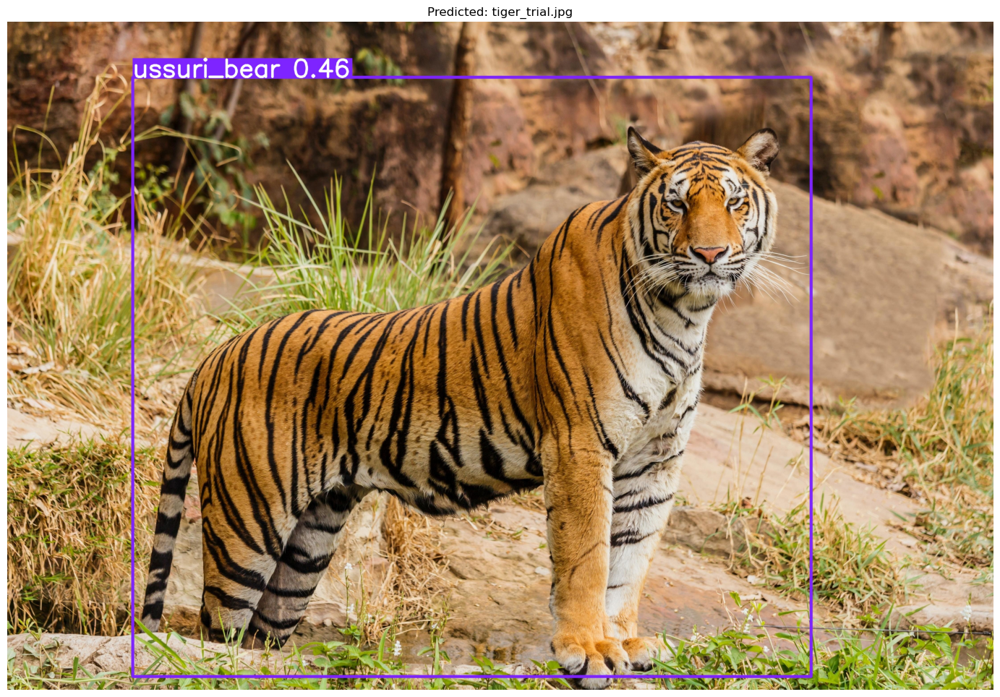

In [13]:
# Path to the predict folder
predict_dir = "runs/detect/predict2"

# List all files in the predict folder
predicted_files = [f for f in os.listdir(predict_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

# Plot each predicted image
for file in predicted_files:
    pred_img_path = os.path.join(predict_dir, file)
    try:
        img = Image.open(pred_img_path)
        plt.figure(figsize=(18, 12))
        plt.imshow(img)
        plt.title(f"Predicted: {file}")
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error loading {file}: {e}")

In [21]:
# Load the best model from the training run
model = YOLO("runs/detect/train/weights/best.pt")

# Make predictions on a test image
results = model.predict("tiger_trial.jpg", save=True)

# Display the predicted image
%matplotlib inline
import os
import matplotlib.pyplot as plt
from PIL import Image


image 1/1 /home/jovyan/__ANIMALS/datasets/ds3_auto_label/tiger_trial.jpg: 448x640 2 tigers, 149.8ms
Speed: 3.2ms preprocess, 149.8ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict2


#### Plot metrics

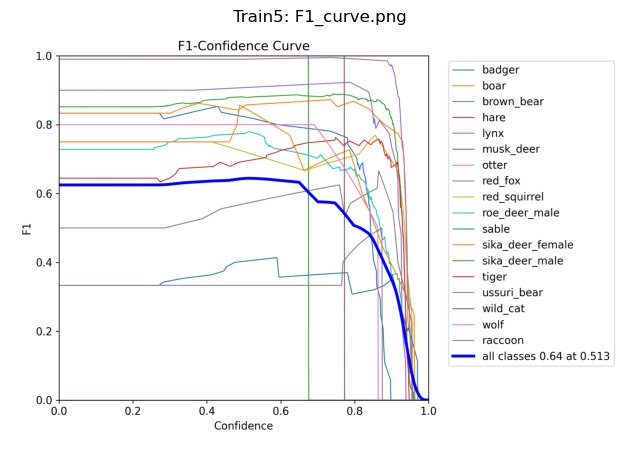

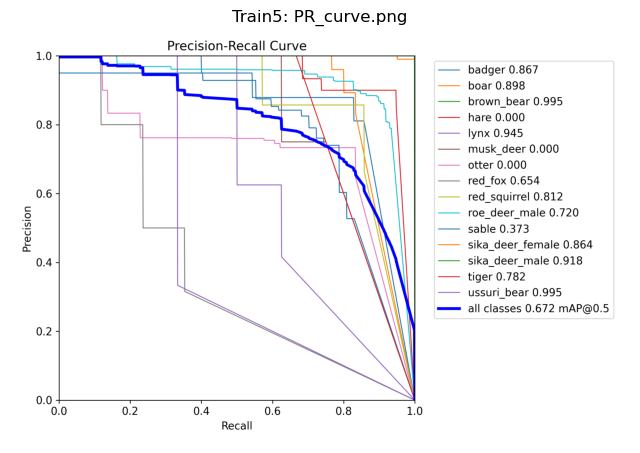

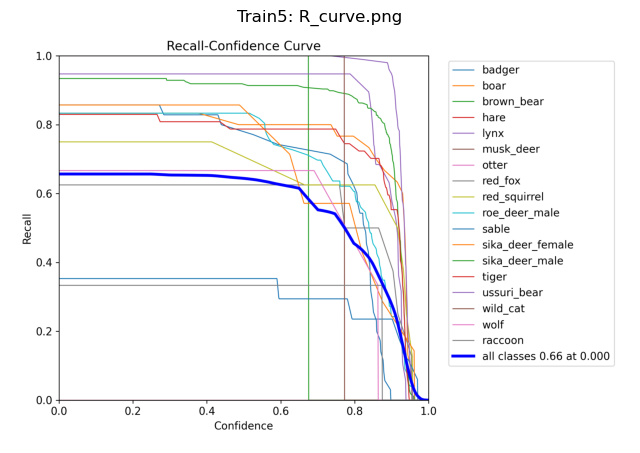

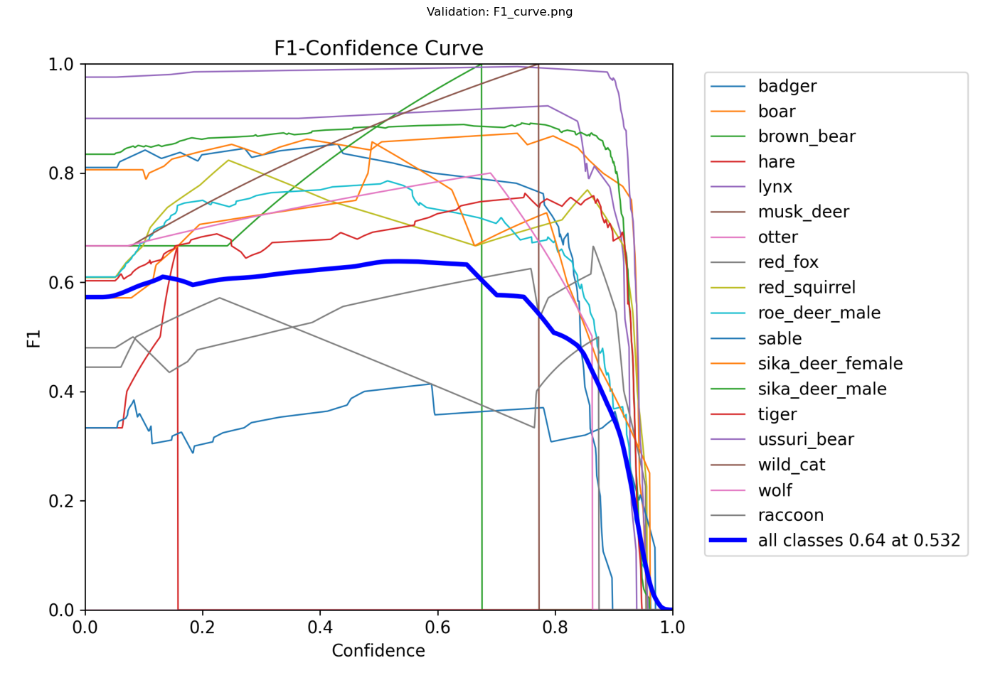

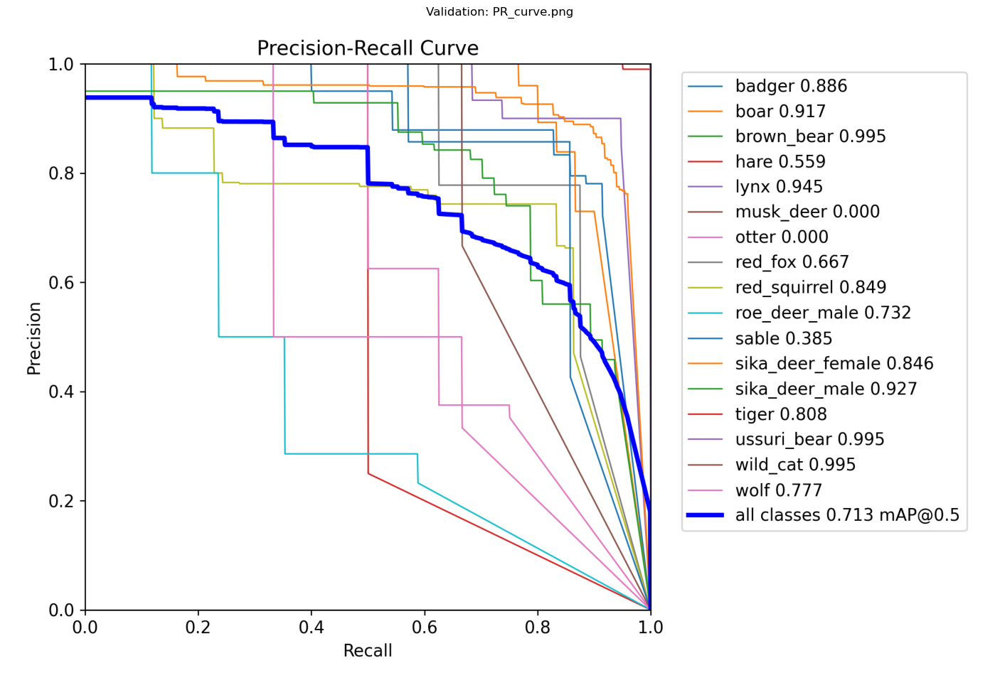

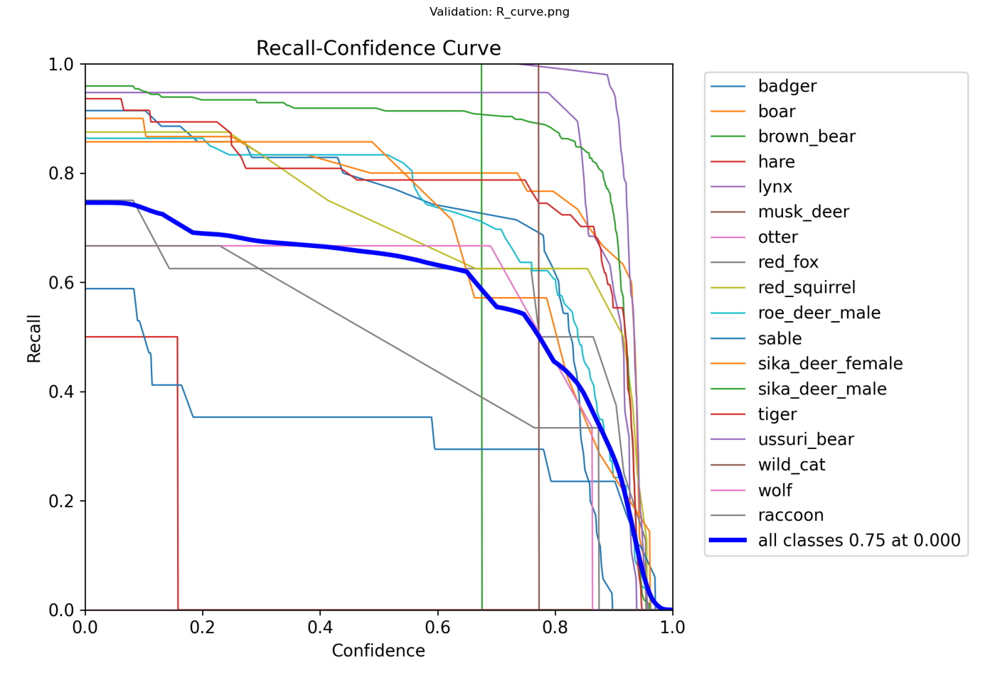

In [14]:
# Path to the train folder
train5_dir = "runs/detect/wildlife_new2/"

# List of metrics to plot
metrics = ["F1_curve.png", "PR_curve.png", "R_curve.png"]

# Plot each metric
for metric in metrics:
    metric_path = os.path.join(train5_dir, metric)
    if os.path.exists(metric_path):
        img = Image.open(metric_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        plt.title(f"Train5: {metric}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Warning: {metric} not found in {train5_dir}.")


# Path to the val folder
val_dir = "runs/detect/wildlife_new22"

# List of metrics to plot
metrics = ["F1_curve.png", "PR_curve.png", "R_curve.png"]

# Plot each metric
for metric in metrics:
    metric_path = os.path.join(val_dir, metric)
    if os.path.exists(metric_path):
        img = Image.open(metric_path)
        plt.figure(figsize=(18, 12))
        plt.imshow(img)
        plt.title(f"Validation: {metric}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Warning: {metric} not found in {val_dir}.")

## Making predictions

In [19]:
import os
import random

# Directory containing images
images_dir = "/home/jovyan/__ANIMALS/images"

# Select 3 random images
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
random_images = random.sample(image_files, min(10, len(image_files)))

# Print selected images
print("Selected images for prediction:")
for img in random_images:
    print(img)

Selected images for prediction:
Uss-56.1.PravayaKomarovka_034_4-17-2024_11-13.JPG
Uss-19.1.Otradnaya_428_4-14-2024_06-02.JPG
Uss-40.1.Rakovka-MalayaRakovka_261_2-13-2024_02-14.JPG
Uss-40.1.Rakovka-MalayaRakovka_414_3-29-2024_04-16.JPG
Uss-17.Volkha_086_3-13-2024_02-53.JPG
Uss-10.1.Goluboy_016_1-12-2024_15-02.JPG
Uss-41.1.MalayaRakovka_135_3-14-2024_08-00.JPG
Uss-17.Volkha_014_12-16-2023_04-18.JPG
Uss-15.Suvorovka_004_12-17-2023_15-15.JPG
Uss-41.MalayaRakovka_153_3-26-2024_17-26.JPG


In [20]:
from ultralytics import YOLO

# Load the trained YOLO model
model = YOLO("runs/detect/wildlife_new2/weights/best.pt")

In [21]:
# Make predictions and save results
for img in random_images:
    img_path = os.path.join(images_dir, img)
    results = model.predict(img_path, save=True, save_dir="runs/detect/predict")
    print(f"Prediction saved for {img} in runs/detect/predict.")


image 1/1 /home/jovyan/__ANIMALS/images/Uss-56.1.PravayaKomarovka_034_4-17-2024_11-13.JPG: 480x640 1 roe_deer_male, 1 sika_deer_male, 162.3ms
Speed: 4.0ms preprocess, 162.3ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict4
Prediction saved for Uss-56.1.PravayaKomarovka_034_4-17-2024_11-13.JPG in runs/detect/predict.

image 1/1 /home/jovyan/__ANIMALS/images/Uss-19.1.Otradnaya_428_4-14-2024_06-02.JPG: 480x640 1 badger, 84.8ms
Speed: 3.0ms preprocess, 84.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict4
Prediction saved for Uss-19.1.Otradnaya_428_4-14-2024_06-02.JPG in runs/detect/predict.

image 1/1 /home/jovyan/__ANIMALS/images/Uss-40.1.Rakovka-MalayaRakovka_261_2-13-2024_02-14.JPG: 480x640 1 sika_deer_male, 82.4ms
Speed: 3.0ms preprocess, 82.4ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict4
Prediction saved for Uss-40.

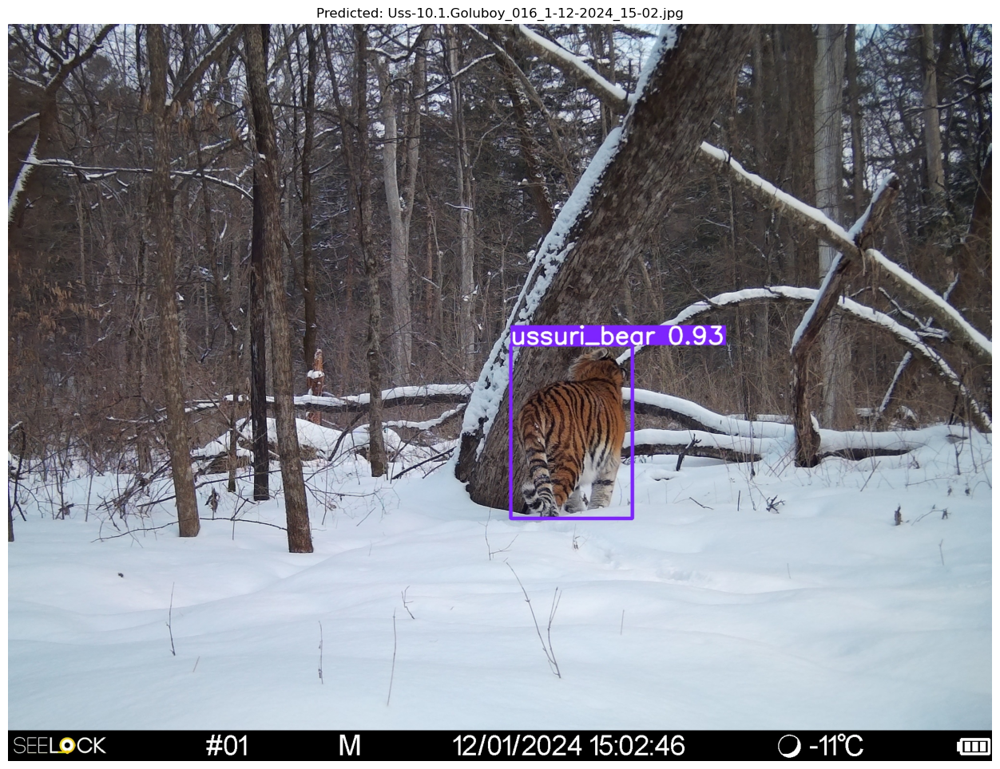

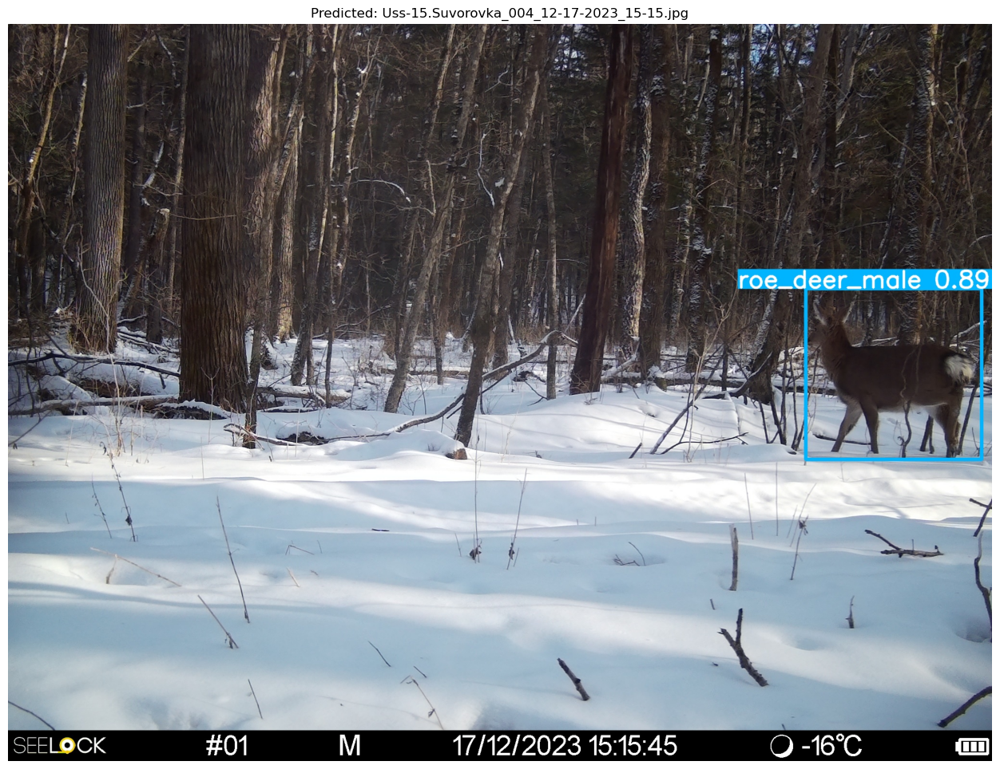

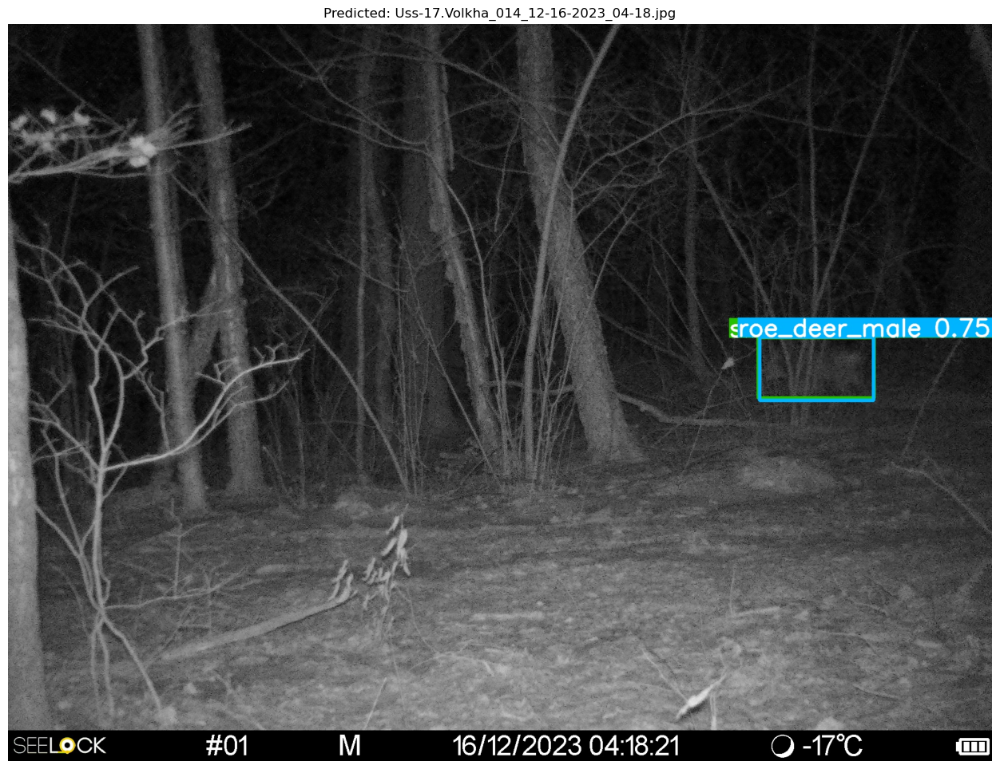

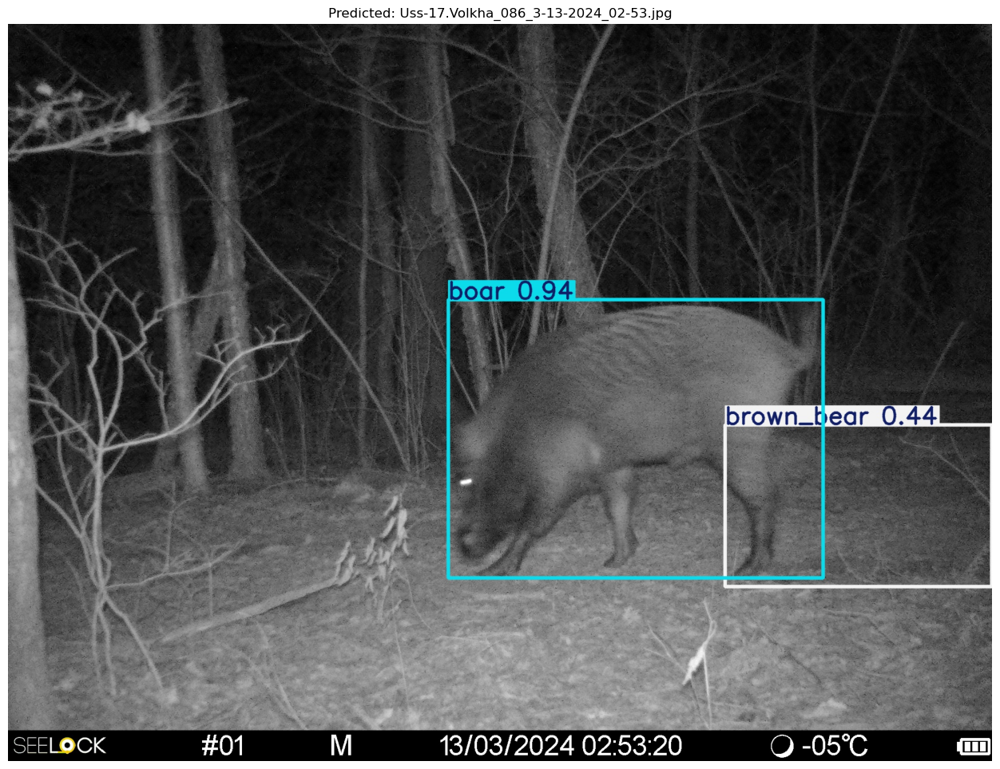

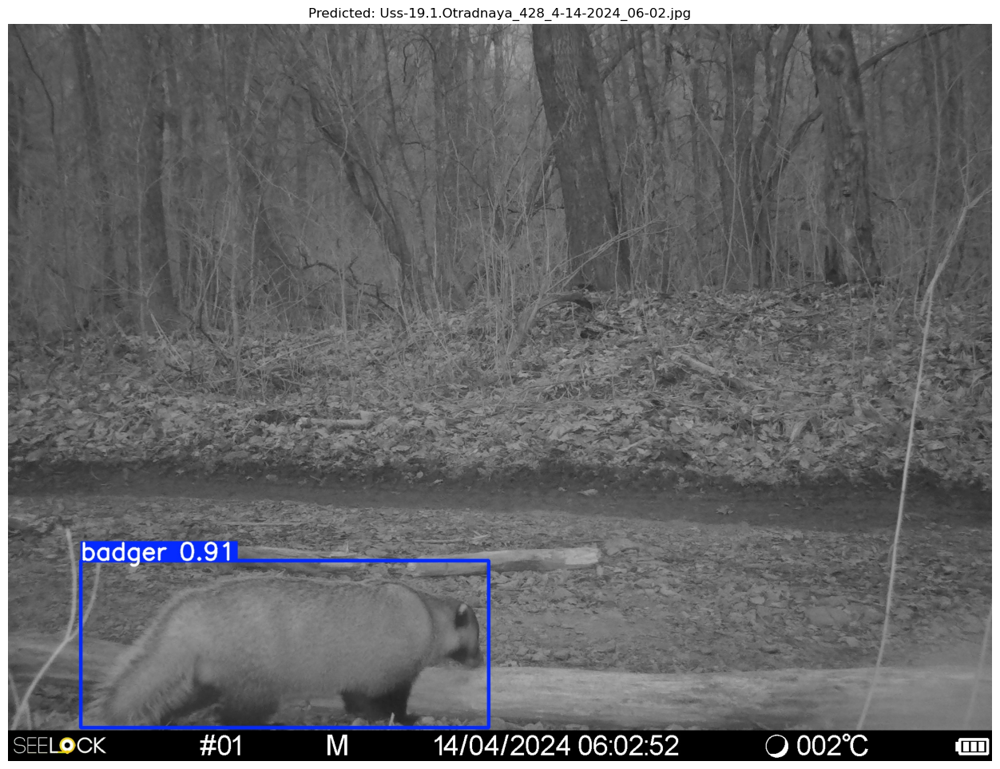

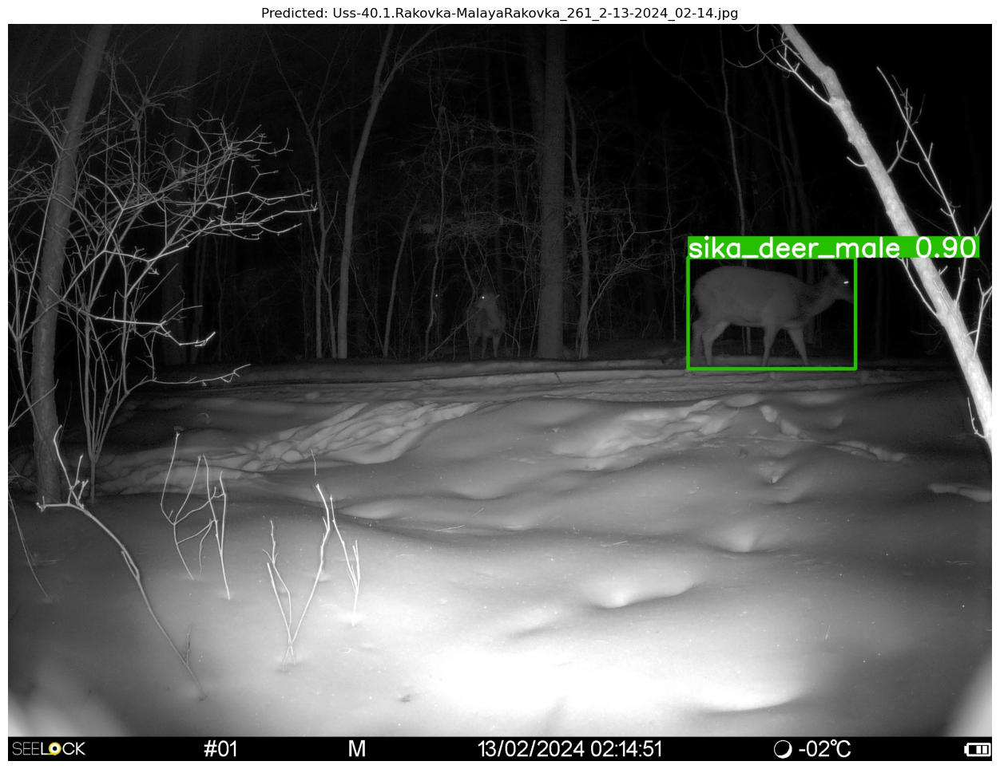

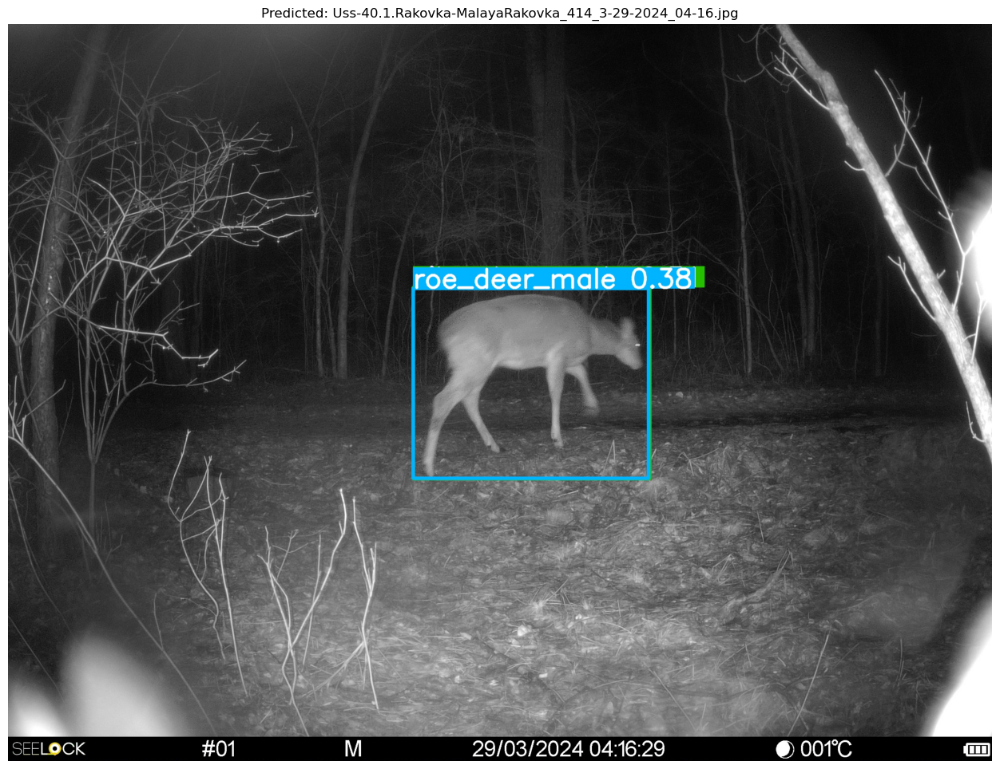

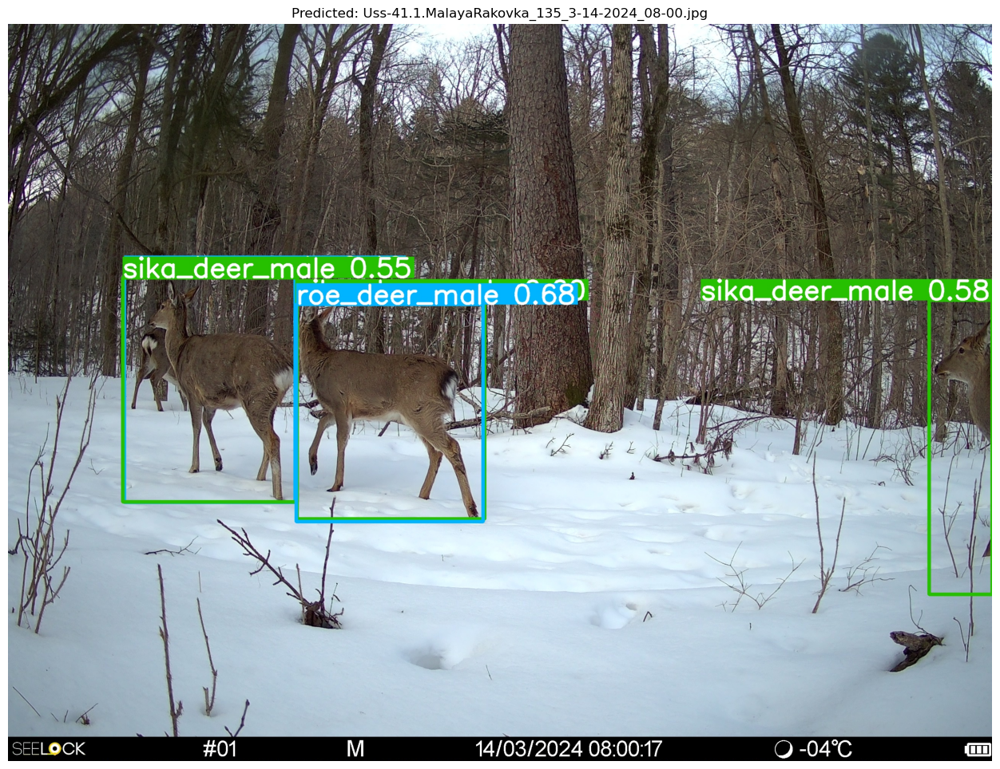

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Path to the predict folder
predict_dir = "runs/detect/predict4"

# List all files in the predict folder
predicted_files = [f for f in os.listdir(predict_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

# Plot each predicted image
for file in predicted_files:
    pred_img_path = os.path.join(predict_dir, file)
    try:
        img = Image.open(pred_img_path)
        plt.figure(figsize=(18, 12))
        plt.imshow(img)
        plt.title(f"Predicted: {file}")
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error loading {file}: {e}")